# Image Similarity, Features and Retrieval

What is a similar images?
https://catriona-campbell.medium.com/doughnut-or-bagel-helping-ai-fill-a-hole-in-perception-f23d29c7838c

## What are image features




### prepare the data, once for WAID and once for the Iguana project
001_hasty_to_tile_data_prep.py

001_isaid_to_tile.py

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from pathlib import Path

In [3]:
imgage_path_iguana = image_path_2 = Path(
    "/Users/christian/data/training_data/2025_02_22_HIT/01_segment_pretraining/segments_12/train/classification/iguana/Fer_FCD01-02-03_20122021_single_images___DJI_0366_x1344_y448.jpg")
image_path_empty_1 = Path(
    '/Users/christian/data/training_data/2025_02_22_HIT/01_segment_pretraining/segments_12/train/classification/empty/San_STJB06_12012023___STJB06_12012023_Santiago_m_2_7_DJI_0128_x2240_y2688.jpg')

image_root_dir = Path(
    "/Users/christian/data/training_data/2025_02_22_HIT/03_all_other/val/classification")
image_cats_and_dogs_root_dir = Path("/Users/christian/Downloads/kagglecatsanddogs_5340/PetImages224")

class_empty = "empty"
class_iguana = "iguana_point"
class_dog = "Dog"
class_cat = "Cat"

iguana_images = [i for i in image_root_dir.joinpath(class_iguana).glob("*.jpg") if not str(i.name).startswith(".")]
cat_images = [i for i in image_cats_and_dogs_root_dir.joinpath(class_cat).glob("*.jpg") if
              not str(i.name).startswith(".")]
dog_images = [i for i in image_cats_and_dogs_root_dir.joinpath(class_dog).glob("*.jpg") if
              not str(i.name).startswith(".")]
empty_images = [i for i in image_root_dir.joinpath(class_empty).glob("*.jpg") if not str(i.name).startswith(".")]

threshold = 20
iguana_images = iguana_images[:threshold]
dog_images = dog_images[:threshold]
cat_images = cat_images[:threshold]
empty_images = empty_images[:threshold]

In [6]:
from active_learning.pipelines.similarity_measure import calculate_pairwise_ssim_cm

# Calculate pairwise SSIM and save results to CSV
results_df = calculate_pairwise_ssim_cm(
    images_class_a=iguana_images,
    images_class_b=empty_images,
    class_a=class_iguana,
    class_b=class_empty,
    output_csv="pairwise_ssim_results.csv",
    vmin=0.0,
    vmax=0.3,
)
# Basic average of all SSIM values
average_ssim = results_df['ssim'].mean()
print(f"Average SSIM {class_iguana} vs {class_empty}: {average_ssim:.4f}")

Using device: mps


Calculating pairwise SSIM: 0it [00:01, ?it/s]


KeyboardInterrupt: 

Using device: mps


Calculating pairwise SSIM: 100%|██████████| 400/400 [00:02<00:00, 170.62it/s]


Results saved to pairwise_ssim_results.csv


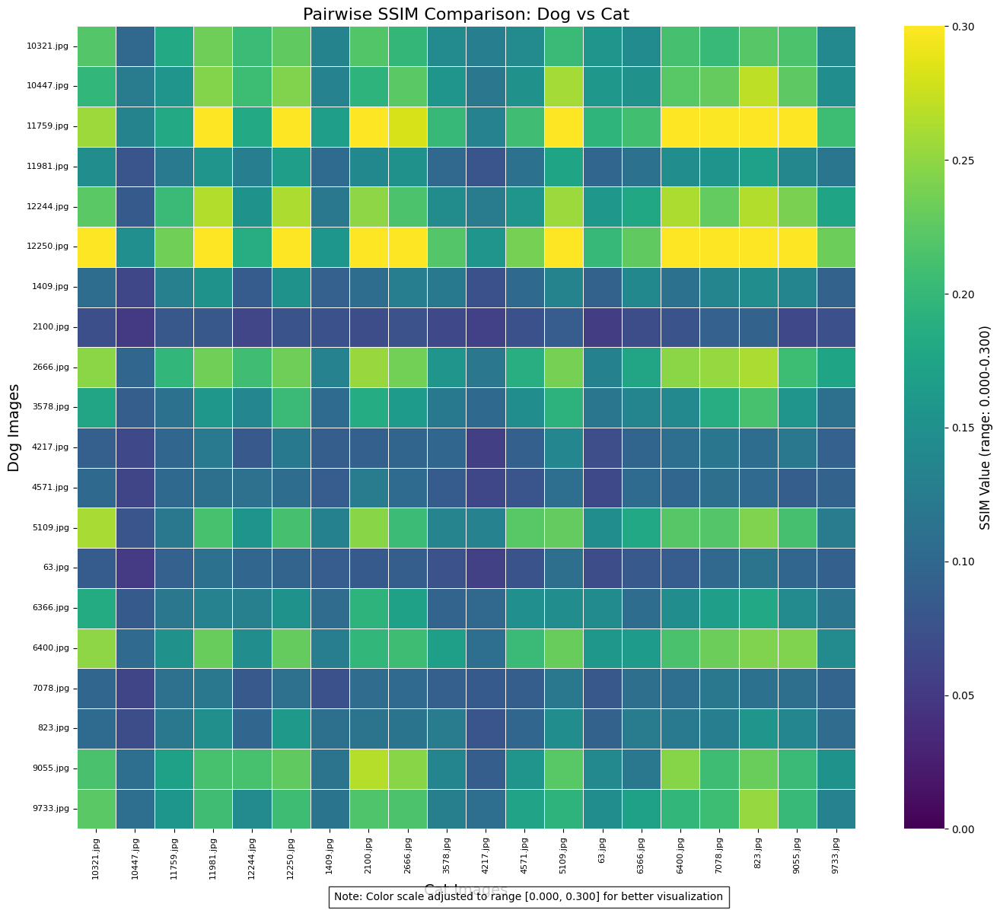

Average SSIM Dog vs Cat: 0.1559


In [5]:
# Calculate pairwise SSIM and save results to CSV
results_df = calculate_pairwise_ssim_cm(
    images_class_a=dog_images,
    images_class_b=cat_images,
    class_a=class_dog,
    class_b=class_cat,
    output_csv="pairwise_ssim_results.csv",
    vmin=0.0,
    vmax=0.3,
)
# Basic average of all SSIM values
average_ssim = results_df['ssim'].mean()
print(f"Average SSIM {class_dog} vs {class_cat}: {average_ssim:.4f}")

#

How to do Reliability Estimation

An Embedding is Worth a Thousand Noisy Labels [ arXiv:2408.14358v1 ]

In [6]:
from pathlib import Path
from active_learning.feature_extraction.timm_feature_extraction import FeatureExtractor


model_name = "timm/resnet34.a1_in1k"
extractor = FeatureExtractor(model_name)

# image_root_dir = "/Users/christian/data/WAID-main/WAID/images/train_sample"  # This should contain subfolders (ClassA, ClassB, ...)
image_root_dir = Path("/Users/christian/data/training_data/2025_02_22_HIT/01_segment_pretraining/segments_12/val/classification")  # This should contain subfolders (ClassA, ClassB, ...)
embedding_save_path = "embeddings_with_labels.csv"
tsne_embedding_save_path = "tsne_embeddings_with_labels.csv"

images_list = [i for i in image_root_dir.rglob("*.jpg") if not str(i).startswith(".")]
class_labels = [x.parent.stem for x in images_list]

df_features = extractor.extract_from_image_list(images_list, class_labels=class_labels, save_path=embedding_save_path)


Using device: mps
Loading pretrained model: timm/resnet34.a1_in1k
Model loaded successfully. Input size: (3, 224, 224)


Extracting features: 100%|██████████| 58/58 [00:00<00:00, 73.68it/s]

Saved embeddings to embeddings_with_labels.csv


In [7]:
df_features

,0,1,2,3,4,5,6,7,8,9,...,503,504,505,506,507,508,509,510,511,class
Fer_FCD01-02-03_20122021_single_images___DJI_0079_FCD01_x3584_y1120.jpg,0.000000,0.000777,0.000425,0.001363,0.297761,0.032656,1.075873e-02,0.032408,0.002603,0.001023,...,0.074530,0.000000,0.066335,0.109390,0.000989,0.000000,0.006631,0.031457,0.000000,empty
Fer_FCD01-02-03_20122021_single_images___DJI_0079_FCD01_x5152_y896.jpg,0.013506,0.000000,0.006829,0.017387,0.298347,0.001050,1.133073e-04,0.000384,0.020231,0.000000,...,0.000000,0.003616,0.011574,0.065170,0.001372,0.009979,0.019615,0.000000,0.050474,empty
Fer_FCD01-02-03_20122021_single_images___DJI_0079_FCD01_x4928_y1120.jpg,0.013251,0.004781,0.003776,0.005416,0.254821,0.000101,4.402267e-04,0.007553,0.104518,0.002660,...,0.000000,0.021478,0.078653,0.101717,0.004154,0.005119,0.002386,0.001042,0.010152,empty
Fer_FCD01-02-03_20122021_single_images___DJI_0079_FCD01_x5152_y2240.jpg,0.004271,0.003874,0.002244,0.041969,0.303236,0.000000,1.495372e-02,0.006001,0.034493,0.006718,...,0.000000,0.001012,0.022594,0.193798,0.000000,0.000335,0.010421,0.000000,0.019742,empty
Fer_FCD01-02-03_20122021_single_images___DJI_0079_FCD01_x3808_y896.jpg,0.000000,0.007715,0.017312,0.001212,0.440965,0.000000,0.000000e+00,0.002453,0.000000,0.001071,...,0.000000,0.006067,0.011776,0.215363,0.000000,0.000056,0.035601,0.000000,0.003071,empty
Fer_FCD01-02-03_20122021_single_images___DJI_0079_FCD01_x5152_y448.jpg,0.015123,0.026863,0.005718,0.049743,0.172767,0.000000,0.000000e+00,0.002495,0.035047,0.018477,...,0.003400,0.032985,0.022652,0.058684,0.027990,0.017497,0.056243,0.000000,0.016088,empty
Fer_FCD01-02-03_20122021_single_images___DJI_0079_FCD01_x4032_y896.jpg,0.001314,0.003214,0.002281,0.020148,0.252291,0.005520,2.054912e-02,0.014262,0.081546,0.003715,...,0.023365,0.023178,0.080486,0.131984,0.000000,0.000000,0.017026,0.003432,0.055501,empty
Fer_FCD01-02-03_20122021_single_images___DJI_0079_FCD01_x4480_y2016.jpg,0.007397,0.000000,0.000000,0.006581,0.352808,0.000000,8.825879e-04,0.034472,0.093533,0.017457,...,0.000000,0.000360,0.026265,0.285913,0.000000,0.000000,0.021676,0.000000,0.020216,empty
Fer_FCD01-02-03_20122021_single_images___DJI_0079_FCD01_x4928_y2016.jpg,0.052889,0.000000,0.000000,0.019628,0.340833,0.001758,2.202241e-02,0.000000,0.051163,0.001910,...,0.004851,0.000034,0.054741,0.176215,0.000000,0.005697,0.035777,0.003815,0.007944,empty
Fer_FCD01-02-03_20122021_single_images___DJI_0079_FCD01_x4256_y2016.jpg,0.019234,0.002222,0.000754,0.040594,0.298834,0.000000,5.211178e-05,0.008103,0.051531,0.016384,...,0.002604,0.000000,0.030056,0.179726,0.000000,0.000000,0.004898,0.000000,0.006442,empty


Reduce the hight dimensionality of the features into two dimensions

[1.77977878e-01 1.47652708e-01 8.77718421e-02 8.40618158e-02
 4.22085352e-02 3.91656945e-02 2.89405499e-02 2.88358095e-02
 2.52326312e-02 2.21097351e-02 2.07943414e-02 1.83427512e-02
 1.59695643e-02 1.58045798e-02 1.54990976e-02 1.39513431e-02
 1.35565749e-02 1.21437236e-02 1.14810465e-02 1.04370151e-02
 9.76666802e-03 9.18267708e-03 8.61070387e-03 8.21501985e-03
 7.83124788e-03 7.46310173e-03 7.21688828e-03 6.73738732e-03
 6.30615232e-03 6.05774218e-03 5.96011728e-03 5.86249759e-03
 5.45623541e-03 5.42028248e-03 4.91046334e-03 4.66396062e-03
 4.59187824e-03 4.22021892e-03 4.18091940e-03 3.87312281e-03
 3.66204095e-03 3.62884538e-03 3.38930475e-03 3.25929233e-03
 3.12697997e-03 2.92970374e-03 2.83166650e-03 2.63757372e-03
 2.56979988e-03 2.23674622e-03 2.16474689e-03 2.09913219e-03
 1.84115549e-03 1.52362819e-03 1.37778414e-03 1.22563919e-03
 1.03143852e-03 3.50999476e-32]
Applying t-SNE with perplexity=30...


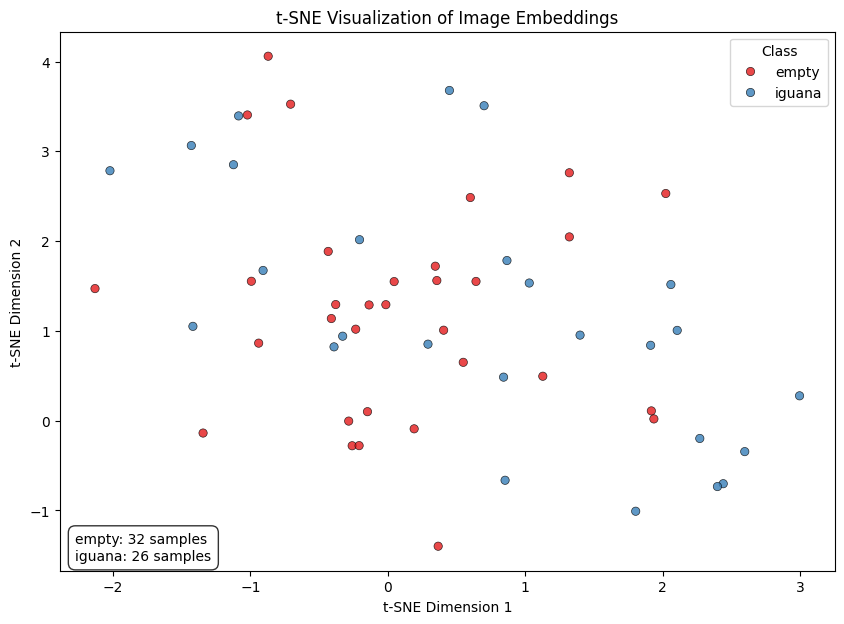

In [8]:
from active_learning.feature_extraction.embedding_clustering import get_tsn_embeddings

df_tsne_embeddings = get_tsn_embeddings(embedding_save_path)

df_tsne_embeddings.to_csv(tsne_embedding_save_path)

In [9]:
df_tsne_embeddings

,X,Y,class,file_name
0,-0.870101,4.060186,empty,Fer_FCD01-02-03_20122021_single_images___DJI_0...
1,1.320795,2.047394,empty,Fer_FCD01-02-03_20122021_single_images___DJI_0...
2,0.600531,2.485954,empty,Fer_FCD01-02-03_20122021_single_images___DJI_0...
3,-0.014093,1.292530,empty,Fer_FCD01-02-03_20122021_single_images___DJI_0...
4,-0.284486,-0.004675,empty,Fer_FCD01-02-03_20122021_single_images___DJI_0...
5,2.022157,2.530910,empty,Fer_FCD01-02-03_20122021_single_images___DJI_0...
6,-0.706939,3.526037,empty,Fer_FCD01-02-03_20122021_single_images___DJI_0...
7,-0.433430,1.885432,empty,Fer_FCD01-02-03_20122021_single_images___DJI_0...
8,1.917220,0.108975,empty,Fer_FCD01-02-03_20122021_single_images___DJI_0...
9,-0.378889,1.293900,empty,Fer_FCD01-02-03_20122021_single_images___DJI_0...


In [10]:
from active_learning.feature_extraction.embedding_clustering import visualize_clusters, perform_clustering

perform_clustering(df_tsne_embeddings, n_clusters=2)

df_tsne_embeddings

Applying K-means clustering with 2 clusters...


,X,Y,class,file_name,cluster,predicted_class,is_correct,cluster_confidence
0,-0.870101,4.060186,empty,Fer_FCD01-02-03_20122021_single_images___DJI_0...,0,empty,True,0.611111
1,1.320795,2.047394,empty,Fer_FCD01-02-03_20122021_single_images___DJI_0...,0,empty,True,0.611111
2,0.600531,2.485954,empty,Fer_FCD01-02-03_20122021_single_images___DJI_0...,0,empty,True,0.611111
3,-0.014093,1.292530,empty,Fer_FCD01-02-03_20122021_single_images___DJI_0...,0,empty,True,0.611111
4,-0.284486,-0.004675,empty,Fer_FCD01-02-03_20122021_single_images___DJI_0...,1,iguana,False,0.545455
5,2.022157,2.530910,empty,Fer_FCD01-02-03_20122021_single_images___DJI_0...,0,empty,True,0.611111
6,-0.706939,3.526037,empty,Fer_FCD01-02-03_20122021_single_images___DJI_0...,0,empty,True,0.611111
7,-0.433430,1.885432,empty,Fer_FCD01-02-03_20122021_single_images___DJI_0...,0,empty,True,0.611111
8,1.917220,0.108975,empty,Fer_FCD01-02-03_20122021_single_images___DJI_0...,1,iguana,False,0.545455
9,-0.378889,1.293900,empty,Fer_FCD01-02-03_20122021_single_images___DJI_0...,0,empty,True,0.611111


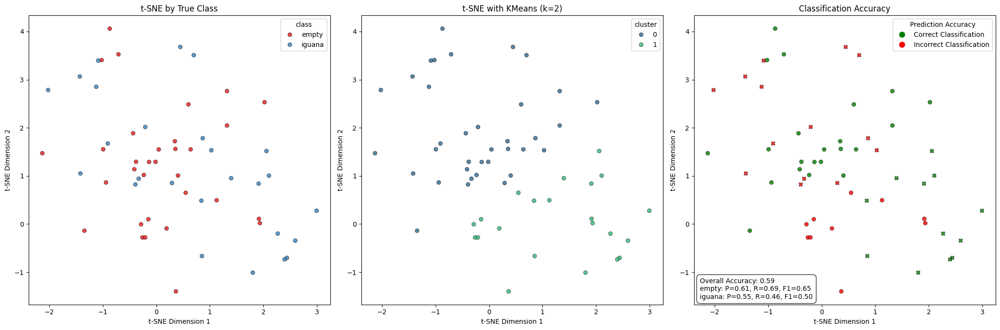

In [11]:

visualize_clusters(df_tsne_embeddings)

In [12]:
from active_learning.feature_extraction.embedding_clustering import get_misclassified_items

### What is the error now?
df_misclassified = get_misclassified_items(df_tsne_embeddings)

df_misclassified

,true_class,predicted_class,cluster,cluster_confidence,X,Y,file_name
4,empty,iguana,1,0.545455,-0.284486,-0.004675,Fer_FCD01-02-03_20122021_single_images___DJI_0...
8,empty,iguana,1,0.545455,1.917220,0.108975,Fer_FCD01-02-03_20122021_single_images___DJI_0...
14,empty,iguana,1,0.545455,-0.259217,-0.279257,Fer_FCD01-02-03_20122021_single_images___DJI_0...
15,empty,iguana,1,0.545455,0.191766,-0.090731,Fer_FCD01-02-03_20122021_single_images___DJI_0...
17,empty,iguana,1,0.545455,-0.147893,0.100450,Fer_FCD01-02-03_20122021_single_images___DJI_0...
24,empty,iguana,1,0.545455,-0.208667,-0.277840,Fer_FCD01-02-03_20122021_single_images___DJI_0...
26,empty,iguana,1,0.545455,0.366447,-1.398598,Fer_FCD01-02-03_20122021_single_images___DJI_0...
27,empty,iguana,1,0.545455,1.127566,0.495040,Fer_FCD01-02-03_20122021_single_images___DJI_0...
30,empty,iguana,1,0.545455,1.935563,0.019493,Fer_FCD01-02-03_20122021_single_images___DJI_0...
31,empty,iguana,1,0.545455,0.548931,0.650023,Fer_FCD01-02-03_20122021_single_images___DJI_0...


## Display those incorrect images


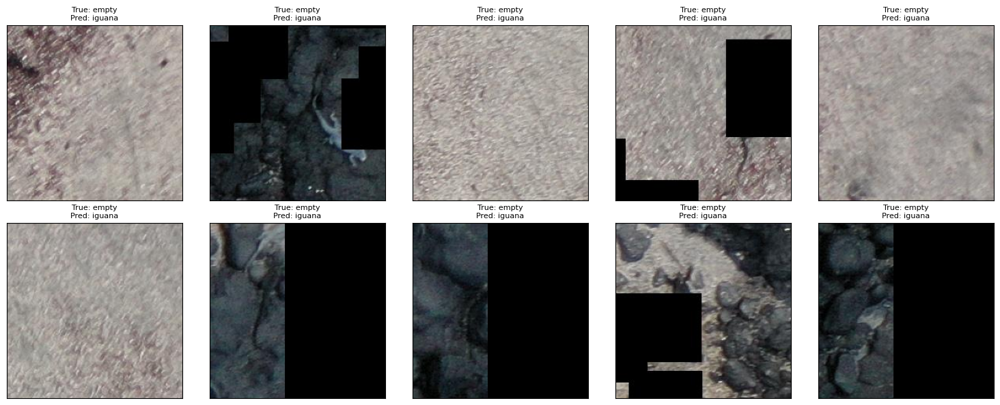

In [13]:

from active_learning.feature_extraction.embedding_clustering import display_misclassified_grid

display_misclassified_grid(df_misclassified[df_misclassified.true_class == "empty"], image_dir=image_root_dir, cols=5, rows=2, figsize=(15, 6))

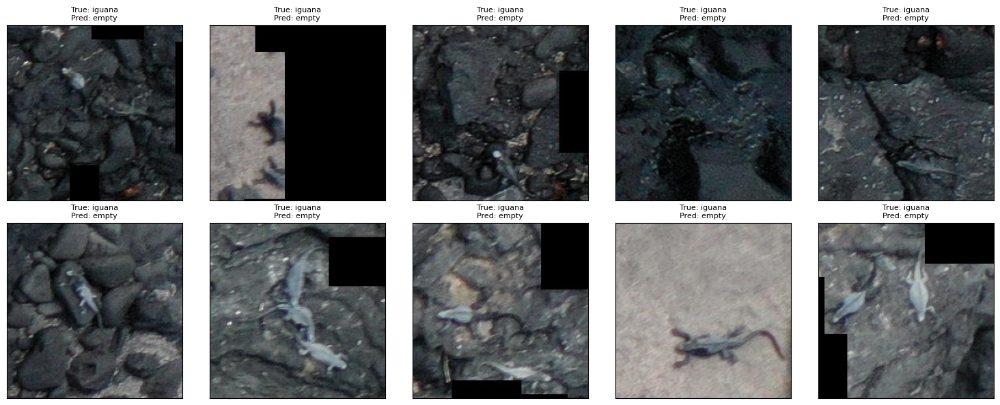

In [14]:
display_misclassified_grid(df_misclassified[df_misclassified.true_class == "iguana"], image_dir=image_root_dir, cols=5, rows=2, figsize=(15, 6))


Diagnosis:
- There are label errors in the data whith images labeled as empty, but they contain animals
- a pretrained resnet model can't seperate occupied from empty images

# Cats and Dogs
Is something wrong with the embeddings?

In [15]:

extractor = FeatureExtractor(model_name)

image_root_dir = Path("/Users/christian/Downloads/kagglecatsanddogs_5340/PetImages224")  # This should contain subfolders (ClassA, ClassB, ...)
embedding_save_path = "embeddings_with_labels_cats_dogs.csv"

images_list = [i for i in image_root_dir.rglob("*.jpg") if not str(i).startswith(".")]


import random

random.shuffle(images_list)
# create a sample subset
images_list = images_list[:1000]
class_labels = [x.parent.stem for x in images_list]

extractor.extract_from_image_list(images_list, class_labels=class_labels, save_path=embedding_save_path)

Using device: mps
Loading pretrained model: timm/resnet34.a1_in1k
Model loaded successfully. Input size: (3, 224, 224)


Extracting features: 100%|██████████| 1000/1000 [00:12<00:00, 81.01it/s]


Saved embeddings to embeddings_with_labels_cats_dogs.csv


,0,1,2,3,4,5,6,7,8,9,...,503,504,505,506,507,508,509,510,511,class
5911.jpg,0.060963,0.000000,0.009283,0.025764,0.147659,0.006398,0.041794,0.050525,0.036721,0.021369,...,0.054274,0.011055,0.001678,0.005250,0.002840,0.033478,0.013717,0.126588,0.027686,Cat
9694.jpg,0.102730,0.007091,0.095095,0.005958,0.076121,0.030487,0.013209,0.010370,0.056848,0.049713,...,0.006817,0.042942,0.009985,0.027516,0.025337,0.080697,0.041547,0.016629,0.005488,Dog
11219.jpg,0.050951,0.024344,0.010059,0.000353,0.165443,0.045860,0.002851,0.000409,0.029339,0.018831,...,0.033371,0.044214,0.013418,0.031217,0.005413,0.009977,0.000000,0.007141,0.000000,Dog
4932.jpg,0.000707,0.004192,0.021297,0.112023,0.262606,0.002086,0.001672,0.008475,0.000000,0.020582,...,0.052965,0.000000,0.000414,0.012457,0.001805,0.007604,0.016553,0.003403,0.006671,Dog
2719.jpg,0.008595,0.016226,0.000000,0.051937,0.131917,0.023755,0.014852,0.045360,0.127847,0.003650,...,0.055595,0.005855,0.000200,0.079908,0.013461,0.018647,0.039006,0.048451,0.012008,Cat
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4075.jpg,0.000753,0.000000,0.001995,0.011890,0.216485,0.066447,0.007141,0.000597,0.000486,0.011636,...,0.117749,0.000000,0.000000,0.015627,0.014750,0.010025,0.000000,0.000000,0.000043,Dog
7445.jpg,0.004000,0.000336,0.000822,0.091536,0.151794,0.010841,0.010892,0.017941,0.214038,0.007042,...,0.051797,0.011722,0.000564,0.048627,0.008311,0.035994,0.040051,0.133795,0.032156,Cat
9468.jpg,0.020457,0.019635,0.021243,0.002631,0.146041,0.001822,0.008002,0.030278,0.010141,0.002103,...,0.027668,0.013186,0.011750,0.027439,0.023772,0.023738,0.053685,0.002160,0.013148,Dog
4659.jpg,0.009032,0.000000,0.000750,0.014819,0.140643,0.006045,0.018557,0.041973,0.110007,0.006056,...,0.072019,0.047070,0.002563,0.012598,0.000839,0.005621,0.029510,0.023871,0.020778,Cat


[1.80200788e-01 5.59405566e-02 3.33493003e-02 3.09869986e-02
 2.62731102e-02 2.26184396e-02 2.19018050e-02 2.02881409e-02
 1.77089651e-02 1.67350600e-02 1.50644558e-02 1.43341904e-02
 1.38682048e-02 1.23704715e-02 1.08781718e-02 1.04397688e-02
 1.01699575e-02 9.69549212e-03 9.30648334e-03 8.85607151e-03
 8.31055321e-03 8.05228470e-03 7.87220220e-03 7.61804081e-03
 7.11220586e-03 7.05868279e-03 6.61604432e-03 6.47711509e-03
 6.31079872e-03 6.25901785e-03 6.05339933e-03 5.79587747e-03
 5.56150921e-03 5.30131604e-03 5.21491292e-03 5.12549544e-03
 4.88146609e-03 4.80241991e-03 4.64092763e-03 4.46831920e-03
 4.40095529e-03 4.25350316e-03 4.23713514e-03 4.12287344e-03
 3.97827787e-03 3.88868996e-03 3.77742508e-03 3.70996168e-03
 3.66372769e-03 3.60258421e-03 3.51559795e-03 3.47231066e-03
 3.41695896e-03 3.30085413e-03 3.21788871e-03 3.15102381e-03
 3.13151454e-03 3.02303555e-03 3.00377555e-03 2.99630022e-03
 2.94617139e-03 2.86589632e-03 2.82922429e-03 2.80271149e-03
 2.78126028e-03 2.698760

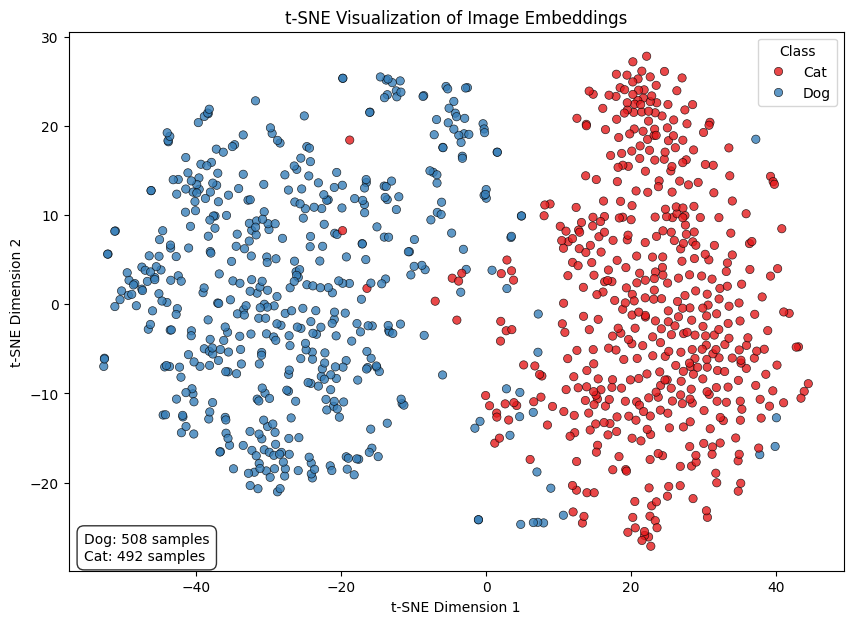

In [16]:
df_tsne_embeddings_cats_dogs = get_tsn_embeddings(embedding_save_path)

In [17]:
perform_clustering(df_tsne_embeddings_cats_dogs, n_clusters=2)

df_tsne_embeddings_cats_dogs

Applying K-means clustering with 2 clusters...


,X,Y,class,file_name,cluster,predicted_class,is_correct,cluster_confidence
0,-4.684865,2.921122,Cat,5911.jpg,1,Dog,False,0.983264
1,-10.393946,3.286431,Dog,9694.jpg,1,Dog,True,0.983264
2,-27.735329,-1.025073,Dog,11219.jpg,1,Dog,True,0.983264
3,-41.459522,16.443266,Dog,4932.jpg,1,Dog,True,0.983264
4,18.583508,-3.244229,Cat,2719.jpg,0,Cat,True,0.927203
...,...,...,...,...,...,...,...,...
995,-40.694561,13.826977,Dog,4075.jpg,1,Dog,True,0.983264
996,24.387133,3.264940,Cat,7445.jpg,0,Cat,True,0.927203
997,-16.295414,-2.413396,Dog,9468.jpg,1,Dog,True,0.983264
998,14.377945,6.597034,Cat,4659.jpg,0,Cat,True,0.927203


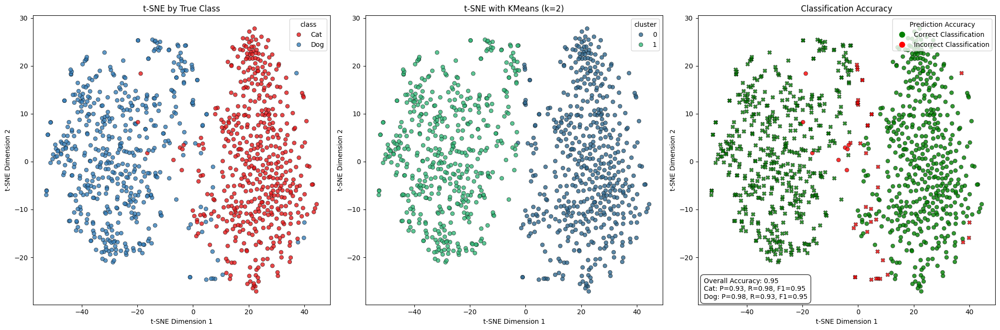

In [18]:
visualize_clusters(df_tsne_embeddings_cats_dogs)

In [19]:
# Get embeddings
df_misclassified_cats_dogs = get_misclassified_items(df_tsne_embeddings_cats_dogs)

df_misclassified_cats_dogs

,true_class,predicted_class,cluster,cluster_confidence,X,Y,file_name
484,Dog,Cat,0,0.927203,4.614114,-12.598742,8574.jpg
475,Dog,Cat,0,0.927203,1.544052,17.036417,4672.jpg
896,Dog,Cat,0,0.927203,-0.223456,19.233723,5973.jpg
492,Dog,Cat,0,0.927203,-0.003672,12.856112,8959.jpg
529,Dog,Cat,0,0.927203,4.859080,9.884213,967.jpg
546,Dog,Cat,0,0.927203,4.876760,9.908031,11599.jpg
557,Dog,Cat,0,0.927203,3.481114,7.614473,4294.jpg
558,Dog,Cat,0,0.927203,-0.286078,19.645018,9166.jpg
432,Dog,Cat,0,0.927203,10.651197,-23.649906,8507.jpg
568,Dog,Cat,0,0.927203,3.282633,-14.690609,8444.jpg


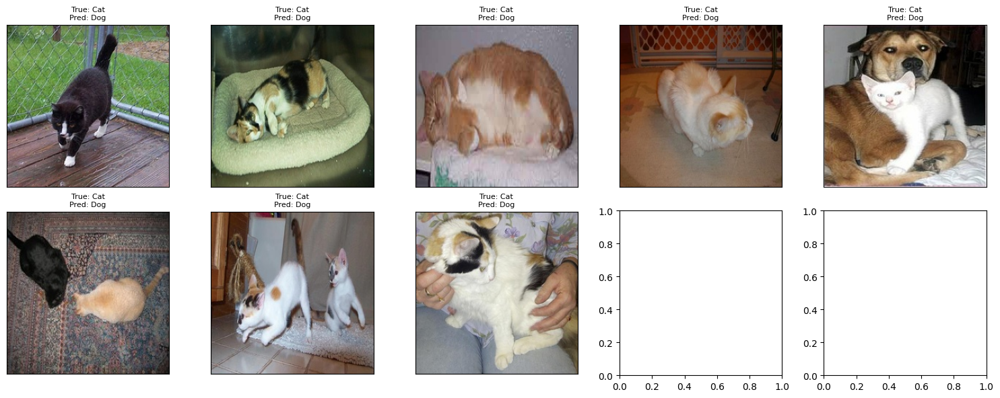

In [20]:
display_misclassified_grid(df_misclassified_cats_dogs[df_misclassified_cats_dogs.true_class == "Cat"], image_dir=image_root_dir, cols=5, rows=2, figsize=(15, 6))


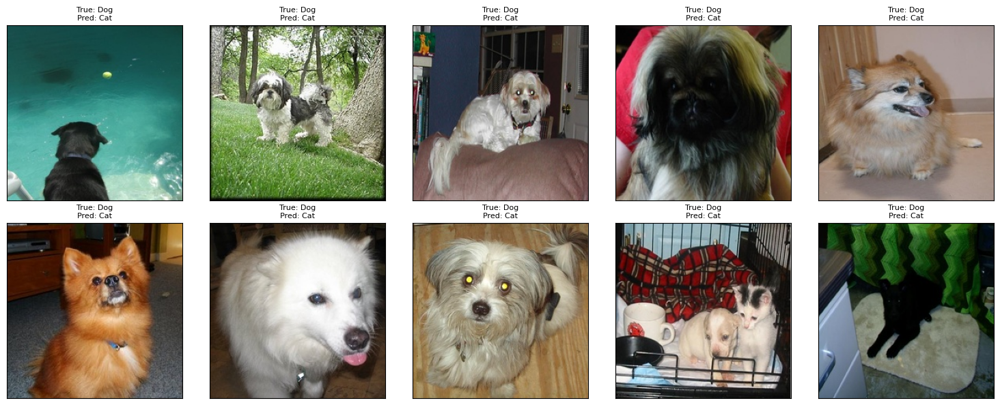

In [21]:
# Visualize
display_misclassified_grid(df_misclassified_cats_dogs[df_misclassified_cats_dogs.true_class == "Dog"], image_dir=image_root_dir, cols=5, rows=2, figsize=(15, 6))




## FIne tune on iguanas

Using device: mps
Creating model: timm/resnet34.a1_in1k with 2 classes
Trainable parameters: 1,026 / 21,285,698 (0.00%)


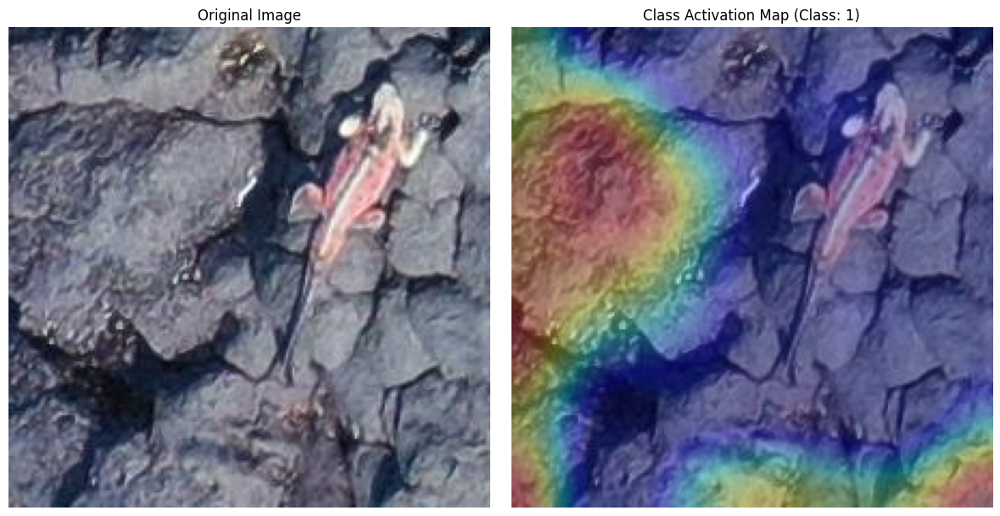

(array([[[ 26,  34,  53],
         [ 14,  22,  41],
         [ 24,  32,  51],
         ...,
         [ 31,  48,  68],
         [ 18,  33,  56],
         [ 18,  30,  54]],
 
        [[ 47,  55,  74],
         [ 31,  39,  58],
         [ 35,  43,  62],
         ...,
         [ 30,  47,  67],
         [ 23,  35,  59],
         [ 19,  31,  55]],
 
        [[ 62,  70,  89],
         [ 42,  50,  69],
         [ 41,  49,  68],
         ...,
         [ 27,  42,  63],
         [ 23,  35,  57],
         [ 18,  29,  51]],
 
        ...,
 
        [[124, 118, 130],
         [110, 107, 118],
         [103,  99, 113],
         ...,
         [122, 126, 137],
         [136, 140, 152],
         [156, 160, 171]],
 
        [[109, 101, 112],
         [ 91,  85,  95],
         [102,  96, 108],
         ...,
         [131, 135, 147],
         [141, 144, 159],
         [151, 155, 167]],
 
        [[106,  98, 109],
         [ 87,  79,  90],
         [110, 104, 116],
         ...,
         [139, 142, 157],
  

In [22]:
from active_learning.pipelines.fine_tune import ModelFineTuner
fine_tuner = ModelFineTuner(
    model_name="timm/resnet34.a1_in1k",  # Use any timm model
    num_classes=2,  # Number of your classes
    freeze_base=True,  # Start with frozen base for transfer learning
    device="mps"
)

fine_tuner.get_class_activation_map(Path("/Users/christian/data/training_data/2025_02_22_HIT/01_segment_pretraining/segments_12/train/classification/iguana/Floreana_02.02.21_FMO01___DJI_0942_x1344_y2240.jpg"))



## Fine Tune with Cats and Dogs

In [25]:
from active_learning.pipelines.data_splitting import split_dataset

split_dataset(
    source_dir=Path("/Users/christian/Downloads/kagglecatsanddogs_5340/PetImages224"),
    output_dir=Path("/Users/christian/Downloads/kagglecatsanddogs_5340/PetImages224_train_val"),
    train_ratio=0.9,
    copy_files=True,
    random_seed=42,
    max_samples_per_class=100,

)

Found 2 classes: Cat, Dog
Processing class: Cat
  Limiting to 100 samples for class Cat
  Copying 90 files to training set


  Train Cat: 100%|████████████████████████████| 90/90 [00:00<00:00, 2064.55it/s]


  Copying 10 files to validation set


  Val Cat: 100%|██████████████████████████████| 10/10 [00:00<00:00, 2147.29it/s]


Processing class: Dog
  Limiting to 100 samples for class Dog
  Copying 90 files to training set


  Train Dog: 100%|████████████████████████████| 90/90 [00:00<00:00, 1750.84it/s]


  Copying 10 files to validation set


  Val Dog: 100%|██████████████████████████████| 10/10 [00:00<00:00, 2321.78it/s]


Split complete:
  Training set: 180 images
  Validation set: 20 images
  Train/val ratio: 0.90/0.10
  Training data: /Users/christian/Downloads/kagglecatsanddogs_5340/PetImages224_train_val/train
  Validation data: /Users/christian/Downloads/kagglecatsanddogs_5340/PetImages224_train_val/val


(180, 20)

## Before Fine Tuning


Using device: mps
Loading pretrained model: timm/resnet34.a1_in1k
Model loaded successfully. Input size: (3, 224, 224)


Extracting features: 100%|██████████| 1000/1000 [00:48<00:00, 20.79it/s]


Saved embeddings to embeddings_with_labels_cats_dogs.csv
[1.83949258e-01 5.29145060e-02 3.39770646e-02 3.05035052e-02
 2.63767250e-02 2.24161965e-02 2.14105388e-02 1.86653578e-02
 1.78198251e-02 1.70610963e-02 1.59736704e-02 1.34036894e-02
 1.28729001e-02 1.19557167e-02 1.16858272e-02 1.07100920e-02
 9.97277673e-03 9.55801225e-03 8.97597453e-03 8.60619075e-03
 8.06637851e-03 7.95145025e-03 7.74992840e-03 7.51238160e-03
 7.18059987e-03 7.12128811e-03 6.93350391e-03 6.61373259e-03
 6.32305801e-03 6.18706182e-03 6.05690103e-03 5.74391597e-03
 5.60814693e-03 5.39310151e-03 5.36521282e-03 5.13709407e-03
 5.02785087e-03 4.88856491e-03 4.78854393e-03 4.71443024e-03
 4.65193326e-03 4.49491922e-03 4.29374947e-03 4.13856345e-03
 4.11658046e-03 4.04592791e-03 3.90627347e-03 3.82124628e-03
 3.71199762e-03 3.61530177e-03 3.57650650e-03 3.49064011e-03
 3.44182789e-03 3.37569257e-03 3.28122945e-03 3.25874286e-03
 3.18413779e-03 3.13165772e-03 3.10083831e-03 3.01959006e-03
 2.93866006e-03 2.87530298e-

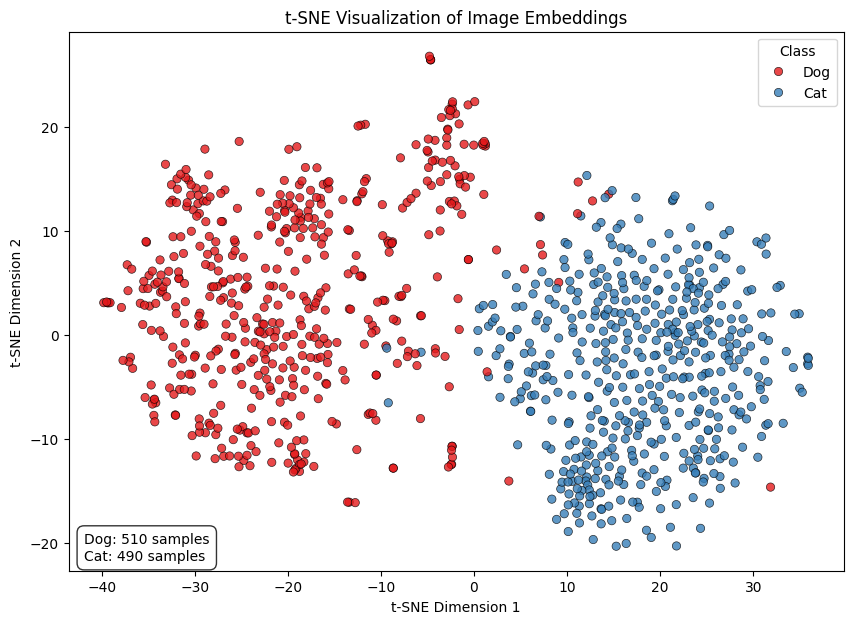

In [32]:
extractor = FeatureExtractor(model_name=model_name)

image_root_dir = Path("/Users/christian/Downloads/kagglecatsanddogs_5340/PetImages224")  # This should contain subfolders (ClassA, ClassB, ...)
embedding_save_path = "embeddings_with_labels_cats_dogs.csv"

images_list = [i for i in image_root_dir.rglob("*.jpg") if not str(i).startswith(".")]


import random

random.shuffle(images_list)
# create a sample subset
images_list = images_list[:1000]
class_labels = [x.parent.stem for x in images_list]

df_features_cats_dogs = extractor.extract_from_image_list(images_list, class_labels=class_labels, save_path=embedding_save_path)

df_features_cats_dogs

df_tsne_embeddings_cats_dogs = get_tsn_embeddings(embedding_save_path, perplexity=40)



Applying K-means clustering with 2 clusters...


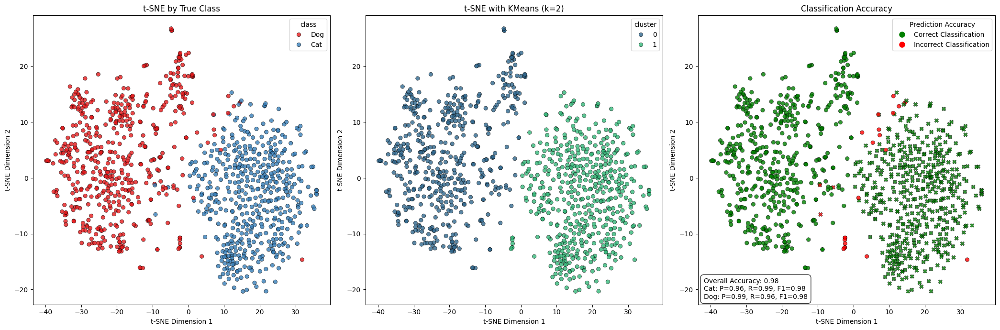

In [33]:
perform_clustering(df_tsne_embeddings_cats_dogs, n_clusters=2)
visualize_clusters(df_tsne_embeddings_cats_dogs)

### After Fine Tuning on cats and dogs

In [28]:
model_path = "/Users/christian/PycharmProjects/hnee/active_learning/active_learning/pipelines/final_model_cats_2025_03_23.pth"

In [29]:
extractor = FeatureExtractor(model_path=model_path, model_name=model_name)

image_root_dir = Path("/Users/christian/Downloads/kagglecatsanddogs_5340/PetImages224")  # This should contain subfolders (ClassA, ClassB, ...)
embedding_save_path = "embeddings_with_labels_cats_dogs.csv"

images_list = [i for i in image_root_dir.rglob("*.jpg") if not str(i).startswith(".")]


import random

random.shuffle(images_list)
# create a sample subset
images_list = images_list[:1000]
class_labels = [x.parent.stem for x in images_list]

df_features_cats_dogs = extractor.extract_from_image_list(images_list, class_labels=class_labels, save_path=embedding_save_path)

df_features_cats_dogs

Using device: mps
Loading checkpoint from: /Users/christian/PycharmProjects/hnee/active_learning/active_learning/pipelines/final_model_cats_2025_03_23.pth
Detected state dictionary


/Users/christian/PycharmProjects/hnee/active_learning/active_learning/feature_extraction/timm_feature_extraction.py:61: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpo

Model loaded successfully. Input size: (3, 224, 224)


Extracting features: 100%|██████████| 1000/1000 [00:26<00:00, 37.79it/s]


Saved embeddings to embeddings_with_labels_cats_dogs.csv


,0,1,2,3,4,5,6,7,8,9,...,503,504,505,506,507,508,509,510,511,class
4075.jpg,0.015730,0.014949,0.010554,0.020940,0.129093,0.023151,0.001036,0.007683,0.114549,0.019763,...,0.032959,0.071600,0.005583,0.043972,0.013676,0.005352,0.056961,0.051086,0.014632,Cat
1748.jpg,0.063529,0.173429,0.057275,0.000000,0.351934,0.008062,0.005136,0.000000,0.000000,0.009015,...,0.299480,0.000000,0.007209,0.045996,0.000000,0.019737,0.000000,0.000000,0.015091,Dog
9533.jpg,0.024894,0.014490,0.001917,0.047805,0.184890,0.010297,0.028756,0.047094,0.154272,0.006065,...,0.125549,0.019728,0.017890,0.044730,0.015580,0.014829,0.060168,0.070569,0.040136,Cat
506.jpg,0.041532,0.013695,0.042463,0.024856,0.234110,0.035192,0.056969,0.091204,0.039552,0.017275,...,0.053559,0.044951,0.058530,0.042315,0.001745,0.018241,0.053863,0.039641,0.087620,Cat
8656.jpg,0.014213,0.047826,0.010871,0.088452,0.180711,0.029821,0.023455,0.015864,0.122742,0.034553,...,0.127640,0.026636,0.040765,0.037038,0.047577,0.021511,0.019435,0.042751,0.048984,Cat
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4632.jpg,0.022788,0.006327,0.084884,0.000110,0.088511,0.014172,0.002755,0.033100,0.021921,0.021843,...,0.117265,0.000000,0.010074,0.005708,0.009959,0.046856,0.018906,0.001852,0.041359,Dog
7266.jpg,0.030372,0.000000,0.019039,0.013395,0.227575,0.002857,0.003751,0.001385,0.000000,0.003235,...,0.122011,0.028512,0.078077,0.011054,0.013854,0.041623,0.003259,0.000000,0.000265,Dog
5766.jpg,0.000522,0.011932,0.000000,0.171043,0.169482,0.006649,0.076149,0.058543,0.139539,0.001248,...,0.128588,0.005559,0.015009,0.086172,0.001655,0.000293,0.086925,0.069987,0.038368,Cat
11250.jpg,0.008640,0.007657,0.000818,0.083424,0.136314,0.017664,0.021611,0.027576,0.091116,0.021979,...,0.041996,0.029102,0.007069,0.039382,0.003138,0.018369,0.050408,0.079746,0.036807,Cat


[2.86715172e-01 3.96554359e-02 3.32198202e-02 2.64189812e-02
 2.45599950e-02 2.21375921e-02 1.89291289e-02 1.78826065e-02
 1.74334720e-02 1.45834173e-02 1.27101475e-02 1.22380041e-02
 1.18236932e-02 1.10582948e-02 9.90703596e-03 9.44079850e-03
 8.93217537e-03 8.53290621e-03 7.79849292e-03 7.21401448e-03
 7.16693636e-03 6.74458283e-03 6.44638815e-03 6.33367874e-03
 6.01023881e-03 5.59226348e-03 5.25106318e-03 5.15528463e-03
 5.05206291e-03 4.88565888e-03 4.72948085e-03 4.51424933e-03
 4.44216169e-03 4.37790669e-03 4.21992070e-03 4.15428642e-03
 4.04383810e-03 4.01223216e-03 3.91265720e-03 3.86592941e-03
 3.75135604e-03 3.58352959e-03 3.54836586e-03 3.48777571e-03
 3.37677891e-03 3.34488302e-03 3.28982833e-03 3.23899195e-03
 3.10655208e-03 3.04520999e-03 3.00158659e-03 2.96223258e-03
 2.94288441e-03 2.88404968e-03 2.78195786e-03 2.71744890e-03
 2.68207695e-03 2.67326249e-03 2.63581777e-03 2.54170096e-03
 2.50828313e-03 2.46691344e-03 2.46596974e-03 2.40969385e-03
 2.33253824e-03 2.324783

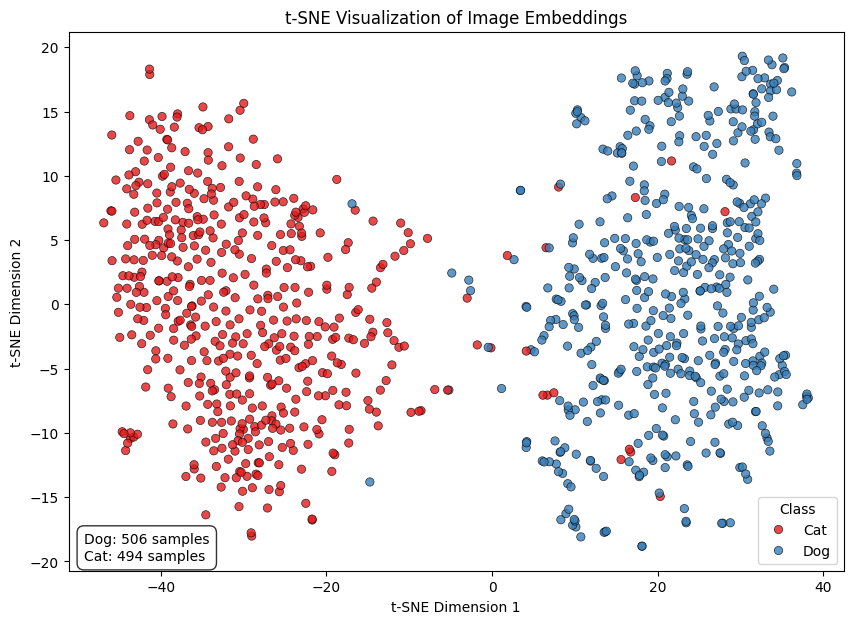

In [30]:
df_tsne_embeddings_cats_dogs = get_tsn_embeddings(embedding_save_path, perplexity=40)


Applying K-means clustering with 2 clusters...


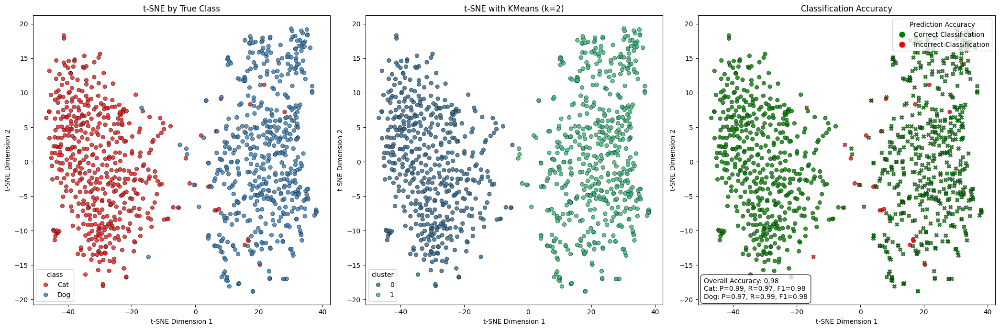

In [31]:
perform_clustering(df_tsne_embeddings_cats_dogs, n_clusters=2)
visualize_clusters(df_tsne_embeddings_cats_dogs)


### Use a finetuned model from better point annotations

In [1]:
model_path = "/Users/christian/PycharmProjects/hnee/active_learning/active_learning/pipelines/final_model_iguanas_2025_03_23.pth"
extractor = FeatureExtractor(model_path=model_path)

image_root_dir = Path(
    "/Users/christian/data/training_data/2025_02_22_HIT/03_all_other/val/classification")  # This should contain subfolders (ClassA, ClassB, ...)
embedding_save_path = "embeddings_with_labels_iguanas.csv"

images_list = [i for i in image_root_dir.rglob("*.jpg") if not str(i).startswith(".")]

import random

random.shuffle(images_list)
# create a sample subset
# images_list = images_list[:1000]
class_labels = [x.parent.stem for x in images_list]

extractor.extract_from_image_list(images_list, class_labels=class_labels, save_path=embedding_save_path)
df_tsne_embeddings_iguanas_points = get_tsn_embeddings(embedding_save_path, perplexity=5)

NameError: name 'FeatureExtractor' is not defined

Extracting features: 100%|██████████| 292/292 [00:03<00:00, 91.35it/s] 


Saved embeddings to embeddings_with_labels_iguanas.csv
[0.98643695 0.01356305]
Applying t-SNE with perplexity=40...


/Users/christian/opt/anaconda3/envs/active_learning/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


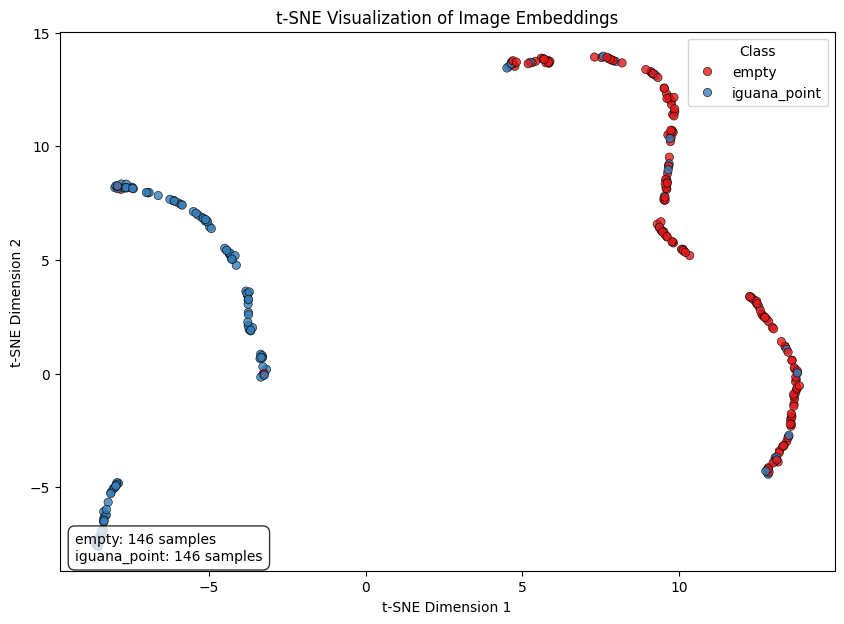

In [33]:
extractor.extract_from_image_list(images_list, class_labels=class_labels, save_path=embedding_save_path)
df_tsne_embeddings_iguanas_points = get_tsn_embeddings(embedding_save_path, perplexity=40)

Applying K-means clustering with 2 clusters...


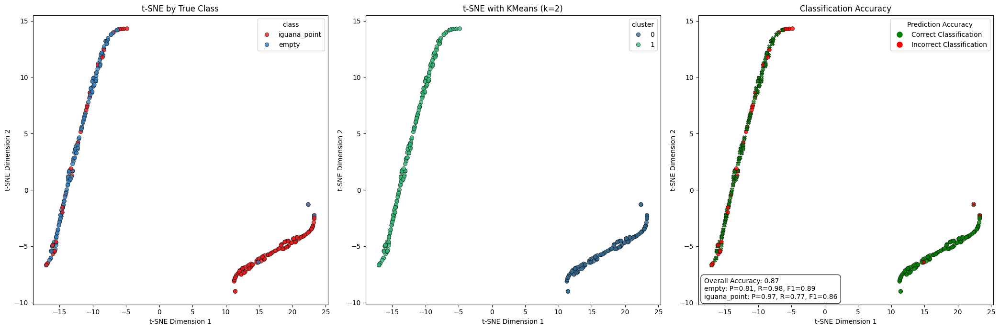

In [31]:
perform_clustering(df_tsne_embeddings_iguanas_points, n_clusters=2)
visualize_clusters(df_tsne_embeddings_iguanas_points)

In [32]:
df_misclassified_iguanas_points = get_misclassified_items(df_tsne_embeddings_iguanas_points)

df_misclassified_iguanas_points

,true_class,predicted_class,cluster,cluster_confidence,X,Y,file_name
9,iguana_point,empty,1,0.807910,-11.632704,5.579168,FMO05___DJI_0148_x2464_y1568.jpg
174,iguana_point,empty,1,0.807910,-5.687741,14.287759,FMO05___DJI_0322_x1568_y1792.jpg
188,iguana_point,empty,1,0.807910,-10.982075,7.090029,FMO05___DJI_0191_x3808_y2464.jpg
215,iguana_point,empty,1,0.807910,-9.224563,11.092118,FMO05___DJI_0322_x1344_y1792.jpg
218,iguana_point,empty,1,0.807910,-10.862836,7.364723,FMO05___DJI_0176_x2912_y0.jpg
229,iguana_point,empty,1,0.807910,-5.987355,14.261142,FMO05___DJI_0322_x1120_y1792.jpg
231,iguana_point,empty,1,0.807910,-12.224887,4.187409,FMO05___DJI_0331_x1792_y2688.jpg
172,iguana_point,empty,1,0.807910,-5.351021,14.295135,FMO05___DJI_0317_x3136_y896.jpg
235,iguana_point,empty,1,0.807910,-16.964876,-6.653963,FMO05___DJI_0331_x2464_y1792.jpg
255,iguana_point,empty,1,0.807910,-14.574873,-1.976623,FMO05___DJI_0176_x4032_y1120.jpg


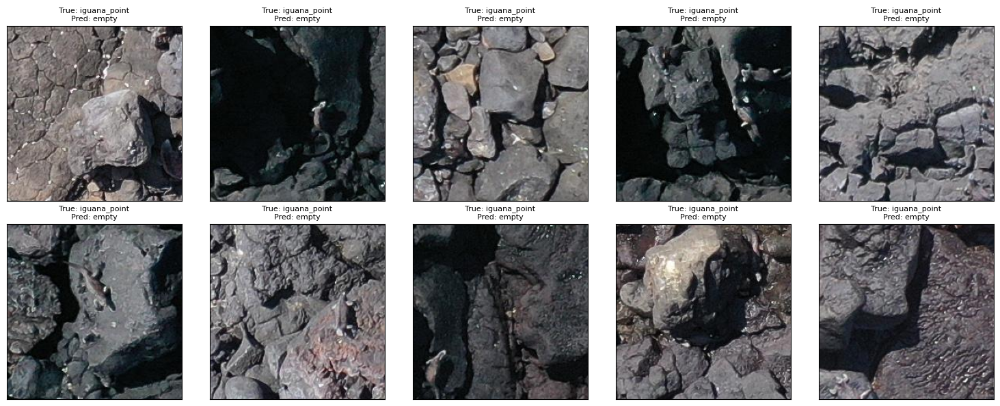

In [33]:
display_misclassified_grid(df_misclassified_iguanas_points[df_misclassified_iguanas_points.true_class == "iguana_point"], image_dir=image_root_dir, cols=5, rows=2, figsize=(15, 6))

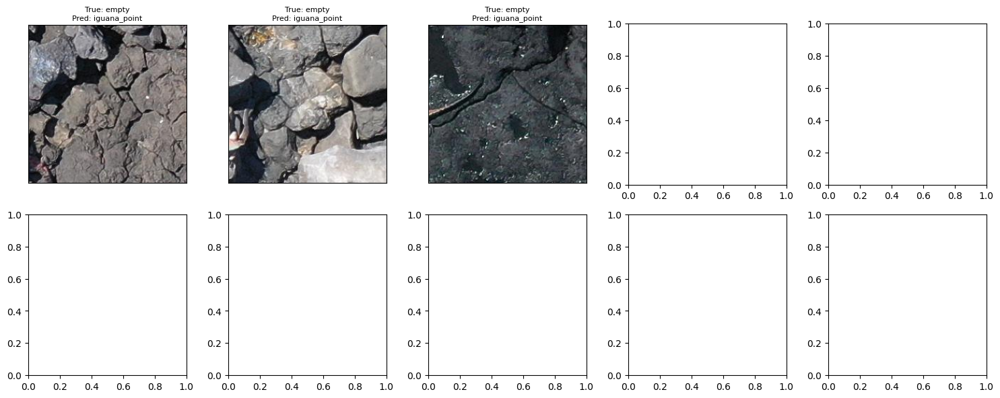

In [34]:
display_misclassified_grid(df_misclassified_iguanas_points[df_misclassified_iguanas_points.true_class == "empty"], image_dir=image_root_dir, cols=5, rows=2, figsize=(15, 6))

# Conclusion

No idea. t-sne makes it look like cats vs dogs is the same as iguanas vs background

SSIM comparison shows Iguana images vs Background is less similar than cats vs dogs



Next steps:
- redo everything with iguana cutouts where they are centered in the image center
- interactively inspect and look for label errors
-